## Example using constrained GP model
This is the code used to produce the first example in the paper _'Gaussian processes with linear operator inequality constraints'_, https://arxiv.org/abs/1901.03134

### Imports

In [1]:
### Basic imports ###
import sys, os

# For plotting
import plotly
import plotly.plotly as pltly
import plotly.graph_objs as go
import plotly.offline as pltlyoff
from IPython.display import display, HTML

# This is for plotting as static images (to show on e.g. GitHub)
import plotly.io as pio
from IPython.display import Image

# Numerics
import numpy as np
import scipy as sp
import itertools
import pyDOE

### Custom files ###

# Path to custom plotly module 'GPPlotly' for plotting 
# can be downloaded at https://github.com/cagrell/gp_plotly
dir_GPPlotly = 'C:\\Data\\git repos\\gp_plotly\\'
sys.path.append(dir_GPPlotly) 

# Path to the constrained GP moule 
# can be downloaded at https://github.com/cagrell/gp_constr
dir_gp_constr = 'C:\\Data\\git repos\\gp_constr\\'
sys.path.append(dir_gp_constr) 

# Import
from GPPlotly.plottingfunctions import PlotGP2d, add_traces_to_fig
from GPConstr.model import kernel_RBF, GPmodel, Constraint

### Setup notebook ###
pltlyoff.init_notebook_mode(connected=True)
print('Python version', sys.version)

Loading constrained GP module from C:\Data\git repos\gp_constr
Loading R wrapper...
Running R from rpy2: R version 3.4.3 (2017-11-30)


Python version 3.6.3 (v3.6.3:2c5fed8, Oct  3 2017, 18:11:49) [MSC v.1900 64 bit (AMD64)]


## 1. Define function for generating synthetic test/training data


In [2]:
# Function to emulate/estimate
def fun(x):
    return (np.arctan(20*x - 10) - np.arctan(-10))/3

## 2. Regression with Gaussian noise

### 2.1. Generate synthetic training data

In [3]:
# Design data - with noise
n = 50
noise_std = 0.2
x_design = np.random.uniform(0.1, 0.8, n)
y_design = fun(x_design) + np.random.normal(0, noise_std, n)

# For plotting
x_test = np.linspace(0, 1, 500)
y_true = fun(x_test)

### 2.2. Define GP model (without constraints)

In [4]:
# Set up model
ker = kernel_RBF(variance = 0.5, lengthscale = [0.1])
model = GPmodel(kernel = ker, likelihood = 1, mean = 0) 

# Add the training data
model.X_training = x_design.reshape(-1, 1)
model.Y_training = y_design

In [5]:
# Optimize hyperparameters
model.optimize(include_constraint = False, fix_likelihood = False)
print(model)

..Running optimization for unconstrained GP ... DONE - Total time: 0.112 seconds
----- GP model ----- 
 mean = 0 
 likelihood = 0.04073052062408954 
 kernel: 
   type = RBF 
   input dim = 1 
   lenghtscale = [0.24542893] 
   variance = 0.31434516011333496 
 constraint: 
   No constraints 
---------------------


In [6]:
# Plot unconstrained GP
mean_unconstr, cov_unconstr = model.calc_posterior_unconstrained(x_test.reshape(-1, 1), full_cov = True)
mean_unconstr = np.array(mean_unconstr).flatten()
var_unconstr = np.diagonal(cov_unconstr)

num_samples = 30
show_samplepaths = True
samplepaths_unconstr = []
if show_samplepaths: samplepaths_unconstr = np.random.multivariate_normal(mean_unconstr, cov_unconstr, num_samples).T

fig_unconstr_1 = PlotGP2d(x_mean = x_test, mean = mean_unconstr, var = var_unconstr,
                        x_obs = model.X_training[:,0], y_obs = model.Y_training, 
                        num_std = 1.2815,
                        x_true = x_test, y_true = y_true,
                        samplepaths = samplepaths_unconstr,
                        title = 'Unconstrained GP', xrange = [0, 1], yrange = [-1.7, 1.7], smoothing = True)

pltlyoff.iplot(fig_unconstr_1, filename='')

..Running calculation of K_w ... SKIP - (cached)
..Running calculation of Cholesky factor for K_w ... SKIP - (cached)
..Calculating f* | Y ... DONE - Total time: 0.016 seconds


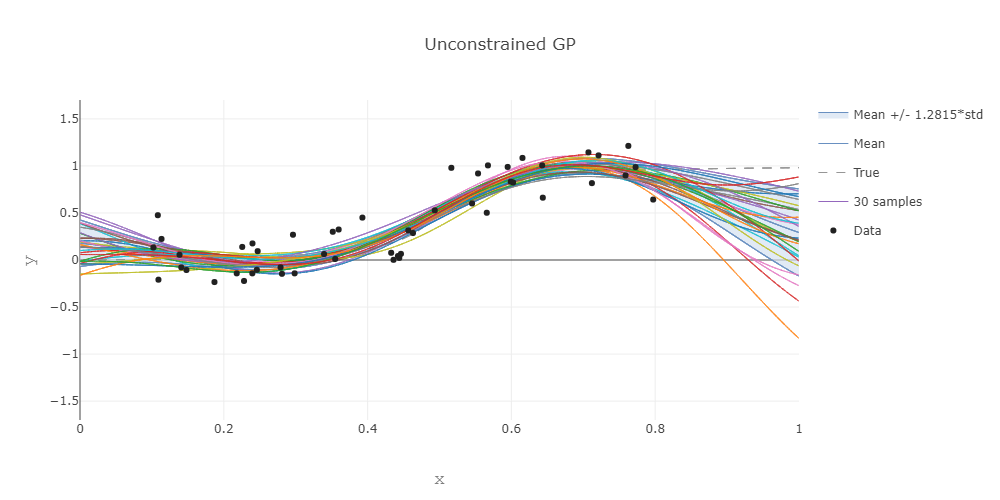

In [7]:
# Show plot as static image
Image(pio.to_image(fig_unconstr_1, width=1000, height=500, scale=1, format='png'))

### 2.2.3. Include constraints (boundedness and monotonicity)

In [8]:
# Helper functions for constraints

def constant_function(val):
    """ Return the constant function"""
    def fun(x):
        return np.array([val]*x.shape[0])
    
    return fun

def fun_UB(x):
    """ Upper bound function """
    return np.log(30*x.flatten() + 1)/3 + 0.1


In [9]:
# Define constraints for bounding the function and its derivative
constr_bounded = Constraint(LB = constant_function(0), UB = fun_UB)
constr_deriv = Constraint(LB = constant_function(0), UB = constant_function(float('Inf')))

In [10]:
# Add constraints to model
model.constr_bounded = constr_bounded
model.constr_deriv = [constr_deriv] # Add list of constraints for multi-dimensional functions
model.constr_likelihood = 1E-6

print(model)

----- GP model ----- 
 mean = 0 
 likelihood = 0.04073052062408954 
 kernel: 
   type = RBF 
   input dim = 1 
   lenghtscale = [0.24542893] 
   variance = 0.31434516011333496 
 constraint: 
   f [0], df/dx_1 [0] 
   constr_likelihood = 1e-06 
---------------------


In [11]:
# Search for a suitable set of virtual observation locations where the constraint is imposed
df = model.find_XV_subop(bounds = [(0.001, 1)], p_target = 0.9, i_range = [0, 1])

Searching for points XV s.t. P(a - nu < Lf < b + nu) > p_target = 0.9 for Lf = [f, df/dx_1] and nu = 1.2815515655446004e-06 ...
i = 1, XV[1] = [0.85164969], prob = 0.024679400535004392, optimization time = 0.120 seconds
i = 1, XV[2] = [0.16324808], prob = 0.06255822445863989, optimization time = 0.248 seconds
i = 0, XV[3] = [0.05617907], prob = 0.1226537182788514, optimization time = 0.568 seconds
i = 1, XV[4] = [0.001], prob = 0.32741459423163677, optimization time = 0.452 seconds
i = 0, XV[5] = [0.001], prob = 0.3156418745982672, optimization time = 0.648 seconds
i = 1, XV[6] = [0.99999364], prob = 0.49527835441386986, optimization time = 0.568 seconds
i = 0, XV[7] = [0.99999151], prob = 0.6814376605811628, optimization time = 0.460 seconds
i = 1, XV[8] = [0.78675744], prob = 0.6350201166160084, optimization time = 0.404 seconds
i = 1, XV[9] = [0.20886133], prob = 0.7593754558364169, optimization time = 0.380 seconds
i = 1, XV[10] = [0.10812717], prob = 0.7575266151063923, optimizati

In [12]:
# Plot model with both constraints

mean, var, perc, mode, samples, times = model.calc_posterior_constrained(x_test.reshape(-1, 1), compute_mode = False, num_samples = 10000, save_samples = 30, algorithm = 'minimax_tilting', resample = False)

mean = np.array(mean).flatten()
p_lower = perc[0]
median = perc[1]
p_upper = perc[2]
p_label = '[p{}, p{}]'.format(10, 90)

samplepaths_Z = np.array(samples)

fig_both = PlotGP2d(x_mean = x_test, mean = mean,
                        x_obs = model.X_training[:,0], y_obs = model.Y_training, 
                        p_lower = p_lower, p_upper = p_upper, p_label = p_label,
                        samplepaths =  samplepaths_Z,
                        x_true = x_test, y_true = y_true,
                        title = 'Both constraints', xrange = [0, 1], yrange = [-1.7, 1.7], smoothing = True)

trace_XV_bounded = go.Scatter(x = model.constr_bounded.Xv.flatten(), y = np.zeros(model.constr_bounded.Xv.shape[0]), mode = 'markers', name = 'Xv - boundedness', marker = dict(symbol = 'line-ns-open', color = ('rgb(0, 0, 0)')))
trace_XV_mon = go.Scatter(x = model.constr_deriv[0].Xv.flatten(), y = np.zeros(model.constr_deriv[0].Xv.shape[0]), mode = 'markers', name = 'Xv - monotonicity', marker = dict(symbol = 'x-thin-open', color = ('rgb(0, 0, 0)')))
trace_UB = go.Scatter(x = x_test, y = model.constr_bounded.UB(x_test), mode = 'lines', name = 'Upper bound', line = dict(color = ('rgb(0, 0, 0)'), shape = 'spline', width = 1))
trace_LB = go.Scatter(x = x_test, y = model.constr_bounded.LB(x_test), mode = 'lines', name = 'Lower bound', line = dict(color = ('rgb(0, 0, 0)'), shape = 'spline', width = 1))

fig_both = add_traces_to_fig(fig_both, [trace_UB, trace_LB, trace_XV_bounded, trace_XV_mon])

pltlyoff.iplot(fig_both, filename='')


..Running calculation of K_w ... SKIP - (cached)
..Running calculation of Cholesky factor for K_w ... SKIP - (cached)
..Running preparation step 1 - dependence on (XS, X) ... DONE - time: 0.012 seconds
..Running preparation step 2 - dependence on (XV, X) ... SKIP - (cached)
..Running preparation step 3 - dependence on (XS, XV, X) ... DONE - time: 0.004 seconds
..sampling 10000 times from truncated constraint distribution C~|C, Y DONE - time: 0.624 seconds
..sampling 10000 times from constrained GP f*|C, Y DONE - time: 0.928 seconds
..computing statistics from samples DONE - time: 0.184 seconds
 DONE - Total time: 1.760 seconds


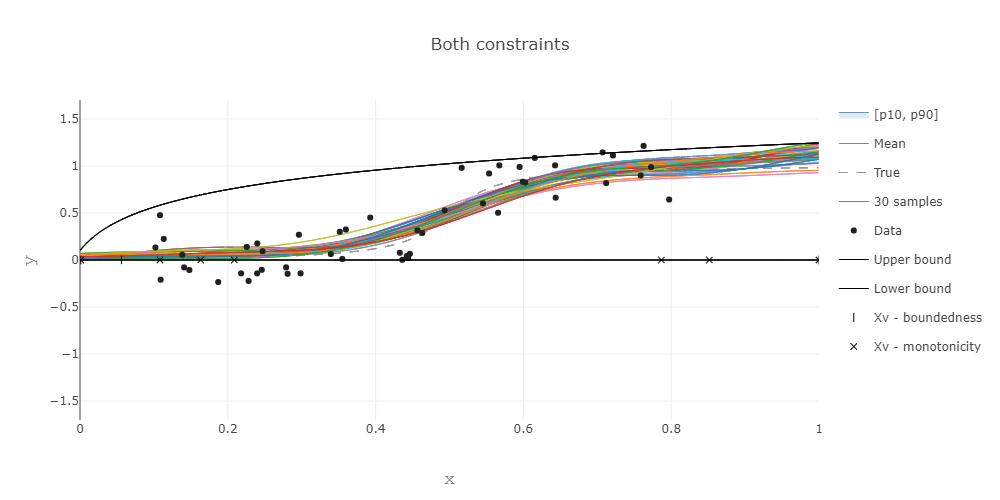

In [13]:
# Show plot as static image
Image(pio.to_image(fig_both, width=1000, height=500, scale=1, format='png'))

#### Show all plots together - interactive

In [14]:
pltlyoff.iplot(fig_unconstr_1, filename='')
pltlyoff.iplot(fig_both, filename='')

#### Show all plots together - static

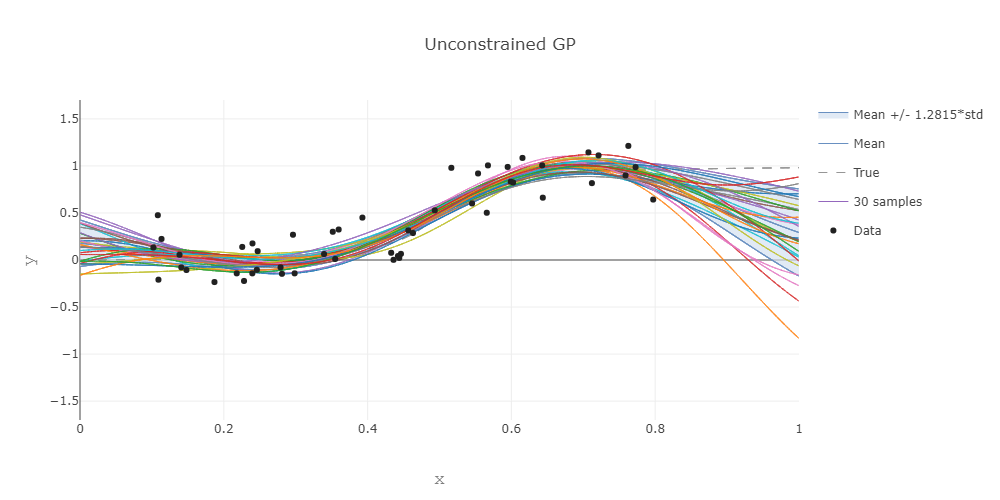

In [15]:
Image(pio.to_image(fig_unconstr_1, width=1000, height=500, scale=1, format='png'))

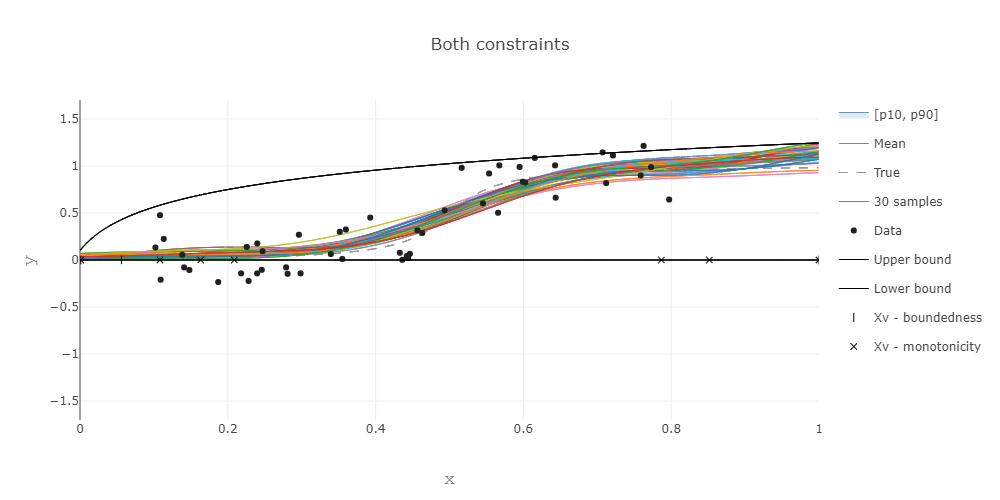

In [16]:
Image(pio.to_image(fig_both, width=1000, height=500, scale=1, format='png'))